In [71]:
import plotly.express as px
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [72]:
df = pd.read_csv('AB_NYC_2019.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [73]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [74]:
df.drop(['host_name','name','host_id','last_review','calculated_host_listings_count'], axis=1, inplace=True)


In [75]:
df.fillna({'reviews_per_month':0}, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   id                   48895 non-null  int64  
 1   neighbourhood_group  48895 non-null  object 
 2   neighbourhood        48895 non-null  object 
 3   latitude             48895 non-null  float64
 4   longitude            48895 non-null  float64
 5   room_type            48895 non-null  object 
 6   price                48895 non-null  int64  
 7   minimum_nights       48895 non-null  int64  
 8   number_of_reviews    48895 non-null  int64  
 9   reviews_per_month    48895 non-null  float64
 10  availability_365     48895 non-null  int64  
dtypes: float64(3), int64(5), object(3)
memory usage: 4.1+ MB


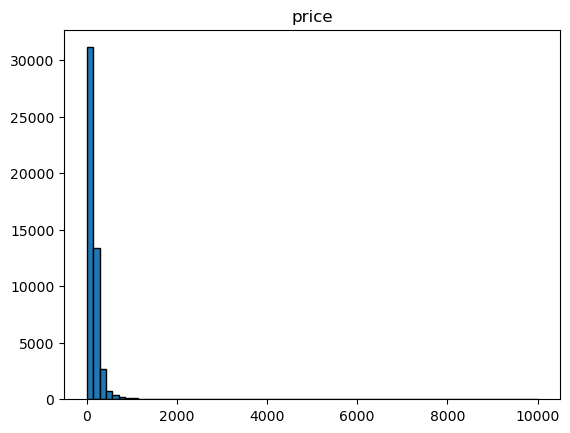

In [116]:
# histogram plot of price. We can see that it's extremely skewed due to outliers
df.hist('price', edgecolor='black', grid=False,bins=70)
plt.savefig('price_hist.png')

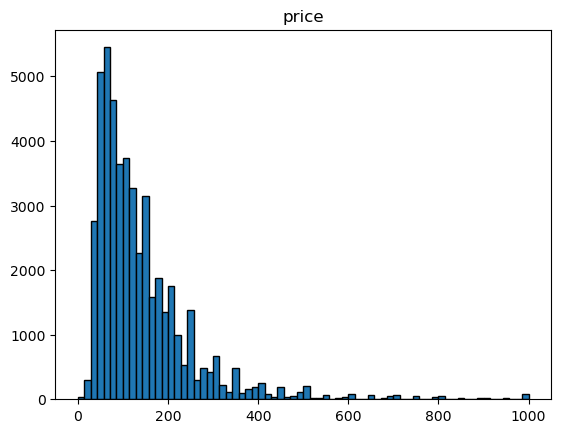

In [118]:
# histogram of price <= 1000 after removing the outliers
df[df['price']<=1000].hist('price', edgecolor='black', grid=False, bins=70)
plt.savefig('price_less_thousand_hist.png')

# Neighbourhood Group analysis
We'll analyse the NYC airbnb listing data by neighbour hood groups

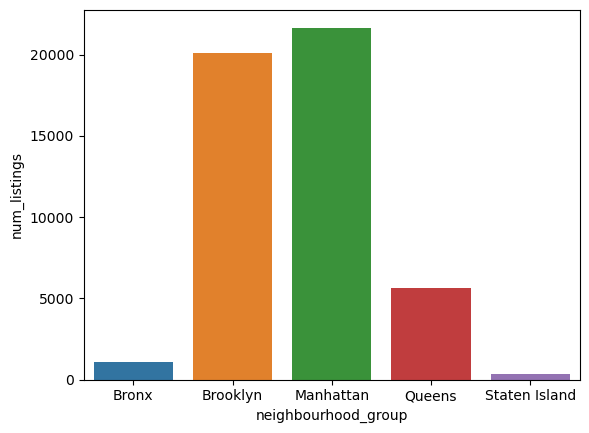

In [125]:
# Let's have a bar plot of number of air bnb listing per neighbourhood group
neighbourhood_group_count = df.groupby('neighbourhood_group').agg('count').reset_index()
neighbourhood_group_count.head()
ax = sns.barplot(data = neighbourhood_group_count, y = 'id', x = 'neighbourhood_group')
ax.set( ylabel='num_listings')
plt.savefig('neighbourhood_group_count.png')

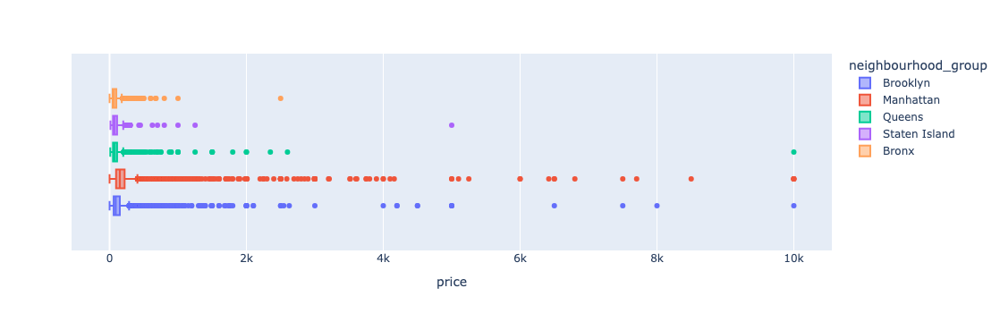

In [78]:
px.box(df, x = 'price', color = 'neighbourhood_group')

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



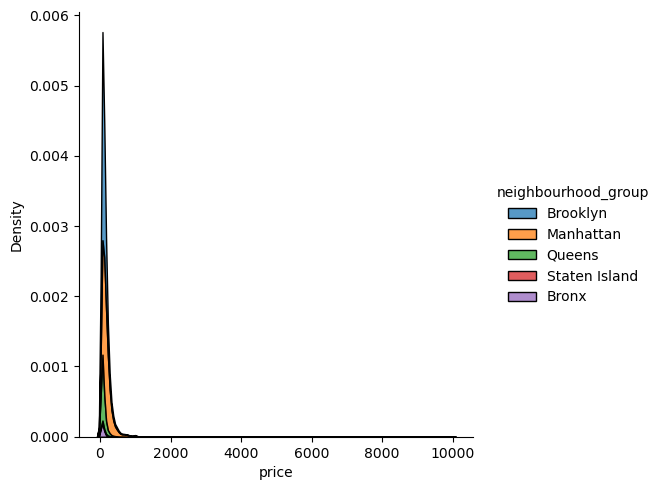

In [79]:
# KDE plot for price. We can see that just like in histogram plot, the data is extremely skewed with few outliers making it very spikey
sns.displot(data=df, x='price', kind='kde', hue= 'neighbourhood_group',multiple='stack')


/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



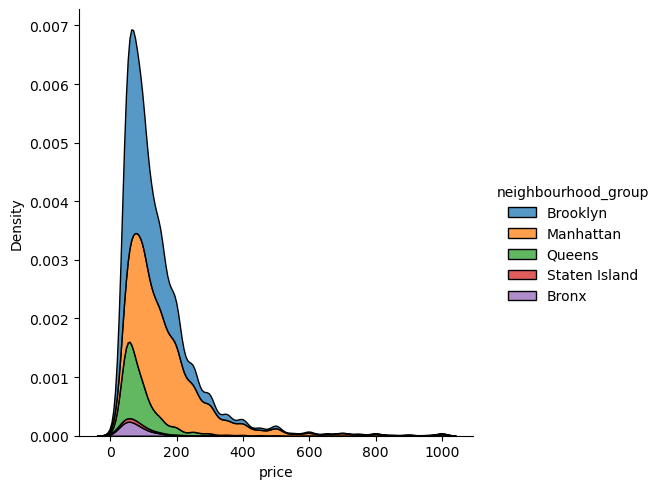

In [120]:
# KDE plot for price <= 1000 after removing the outliers
sns.displot(data=df[df['price']<=1000], x='price', kind='kde', hue= 'neighbourhood_group',multiple='stack')
plt.savefig('neighbourhood_group_kde.png')

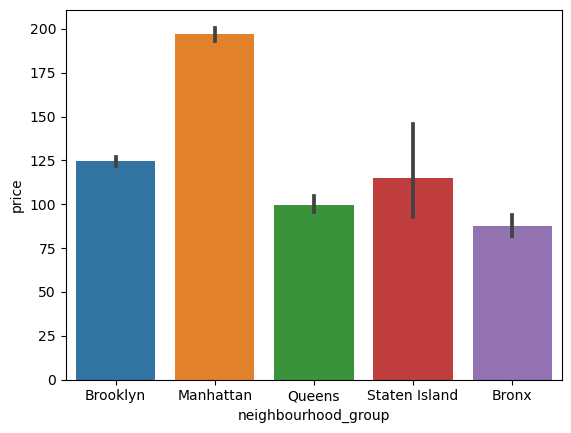

In [121]:
# we can see that Manhattan has the highest estimate of price
sns.barplot(data = df, y = 'price', x = 'neighbourhood_group')
plt.savefig('neighbourhood_group_bar.png')

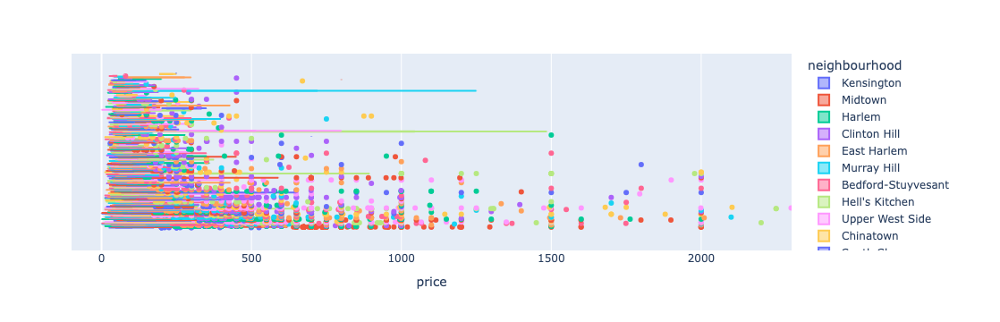

In [98]:
px.box(df, x = 'price', color = 'neighbourhood')


# Room Type analysis
We'll analyse the NYC airbnb listing data by neighbour hood groups

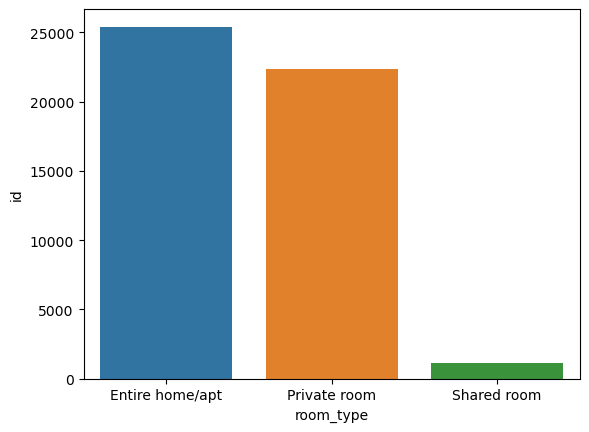

In [122]:
# Let's have a bar plot of number of air bnb listing per neighbourhood group
neighbourhood_group_count = df.groupby('room_type').agg('count').reset_index()
neighbourhood_group_count.head()
sns.barplot(data = neighbourhood_group_count, y = 'id', x = 'room_type')
plt.savefig('room_type_count.png')

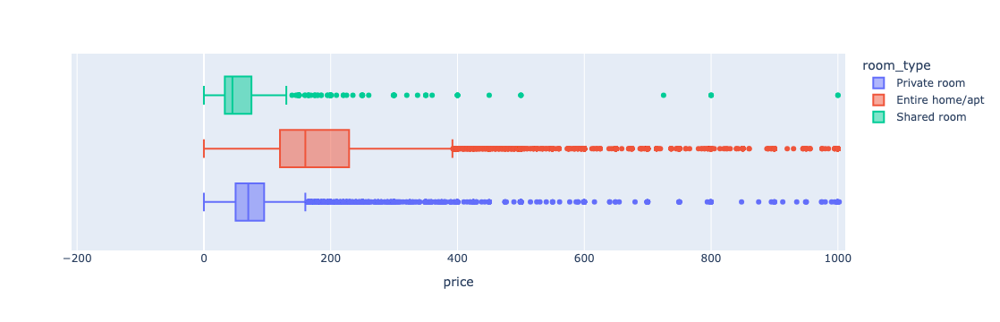

In [91]:
px.box(df, x = 'price', color = 'room_type')

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



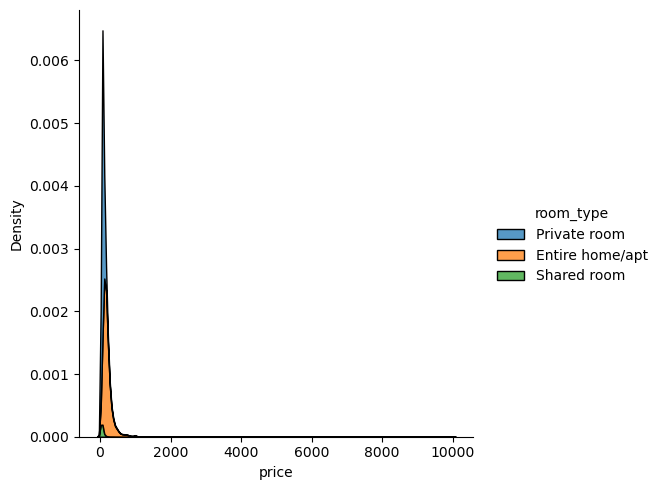

In [93]:
sns.displot(data=df, x='price', kind='kde', hue= 'room_type',multiple='stack')

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



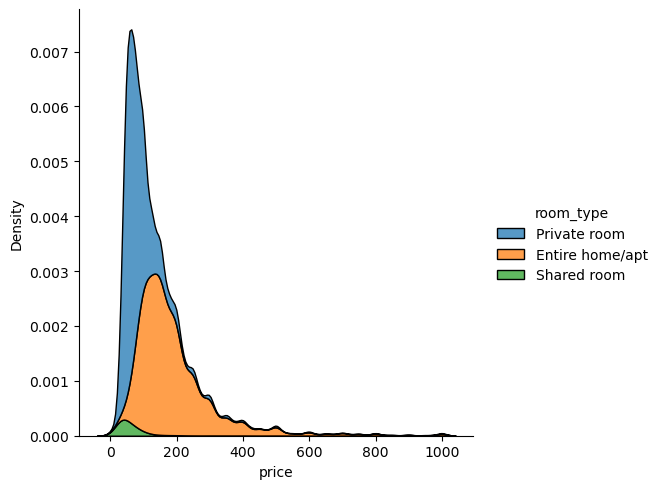

In [123]:
sns.displot(data=df[df['price']<=1000], x='price', kind='kde', hue= 'room_type',multiple='stack')
plt.savefig('room_type_kde.png')

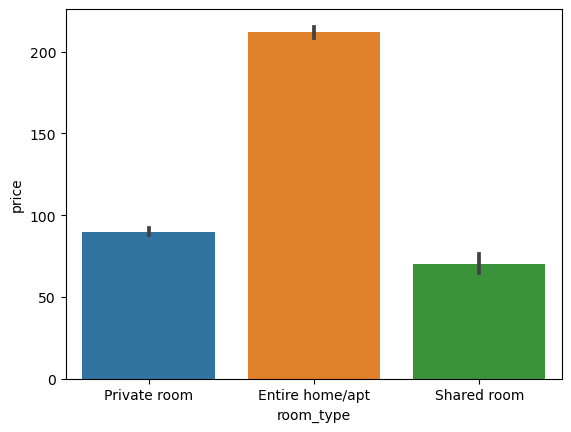

In [124]:
# we can see that Manhattan has the highest estimate of price
sns.barplot(data = df, y = 'price', x = 'room_type')
plt.savefig('room_type_bar.png')

# Geo plots
Let's plot on maps

In [101]:
# px.scatter_geo(df, lat="latitude", lon="longitude",size='price', color="price", scope="usa",fitbounds="locations",projection='albers usa', locationmode='USA-states')

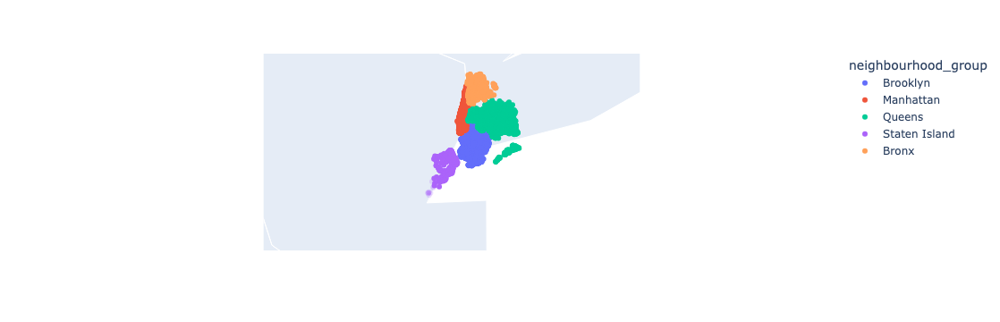

In [99]:
px.scatter_geo(df, lat="latitude", lon="longitude", color="neighbourhood_group", scope="usa",fitbounds="locations",projection='albers usa', locationmode='USA-states')

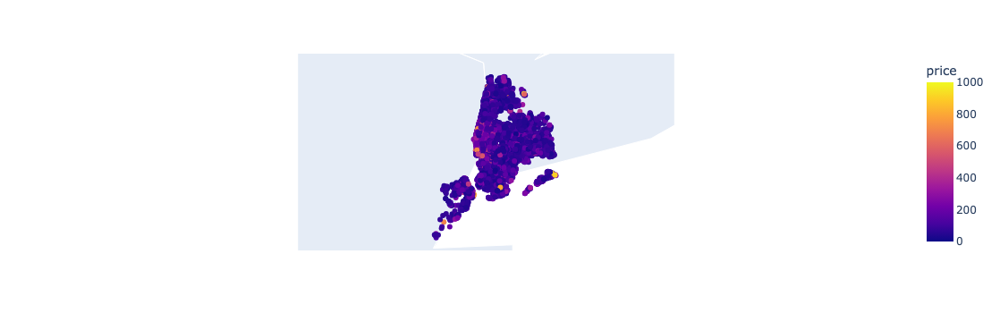

In [102]:
px.scatter_geo(df[df['price']<=1000], lat="latitude", lon="longitude", color="price", scope="usa",fitbounds="locations",projection='albers usa', locationmode='USA-states')

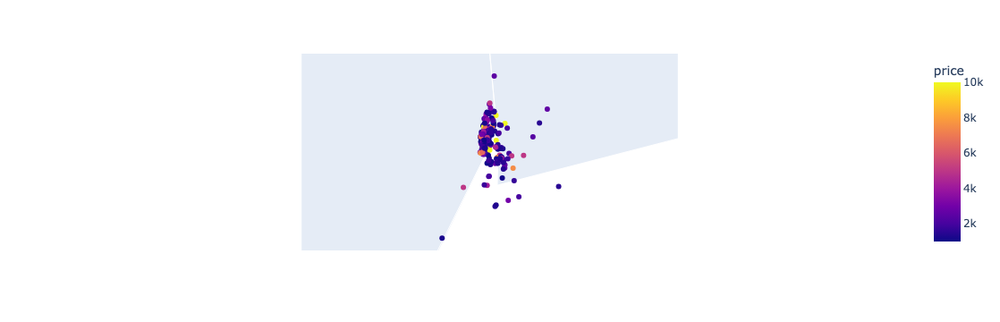

In [103]:
px.scatter_geo(df[df['price']>1000], lat="latitude", lon="longitude", color="price", scope="usa",fitbounds="locations",projection='albers usa', locationmode='USA-states')

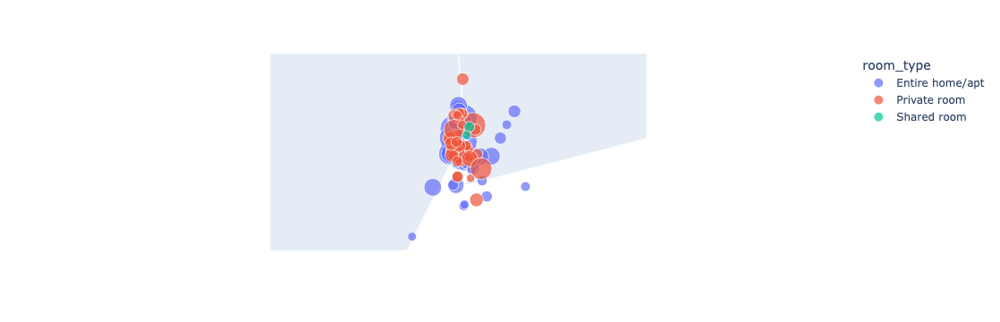

In [126]:
px.scatter_geo(df[df['price']>1000], lat="latitude", lon="longitude", color='room_type',size="price", scope="usa",fitbounds="locations",projection='albers usa', locationmode='USA-states')